## DATA SCIENCE NIGERIA HACKATHON - ABDULAZEEZ ABDULLAH

In [1]:
#Import Necessary Library
import pandas as pd
from matplotlib import pyplot as plt

In [2]:
#Import required dataset for building the model
test = pd.read_excel('C:/Work Files/Personal Data Analytics/Datasets/Data Science Nigeria Hackathon/test.xlsx')
train = pd.read_excel('C:/Work Files/Personal Data Analytics/Datasets/Data Science Nigeria Hackathon/train.xlsx')

# Data Exploration

In [3]:
#Check the first five rows
print(test.head())
print('\n')
print(train.head())

    Customer_ID  months_as_customer  age insured_sex insured_education_level  \
0  Customer_521                   5   26      FEMALE                     PhD   
1  Customer_737                 160   33      FEMALE             High School   
2  Customer_740                 385   51      FEMALE                      MD   
3  Customer_660                 446   57        MALE                 College   
4  Customer_411                  84   29      FEMALE             High School   

  insured_occupation insured_hobbies insured_relationship  capital-gains  \
0    farming-fishing       skydiving        not-in-family          31500   
1    exec-managerial        exercise              husband          61600   
2       craft-repair         reading              husband              0   
3       adm-clerical        sleeping            unmarried          42700   
4  machine-op-inspct     video-games        not-in-family              0   

   capital-loss  ...  incident_severity authorities_contacted 

Note: Both the test and train dataframe has 36 columns each. Clearly all these columns are not necessary in building our model. Therefore, some columns would need to be removed.

In [4]:
#Identify missing or null data in the test dataframe
test.isnull().sum()

Customer_ID                      0
months_as_customer               0
age                              0
insured_sex                      0
insured_education_level          0
insured_occupation               0
insured_hobbies                  0
insured_relationship             0
capital-gains                    0
capital-loss                     0
policy_number                    0
policy_bind_date                 0
policy_state                     0
policy_csl                       0
policy_deductable                0
incident_location                0
incident_hour_of_the_day         0
number_of_vehicles_involved      0
property_damage                  0
bodily_injuries                  0
policy_annual_premium            0
umbrella_limit                   0
insured_zip                      0
incident_date                    0
incident_type                    0
collision_type                   0
incident_severity                0
authorities_contacted            0
incident_state      

In [5]:
#Identify missing or null data in the train dataframe
train.isnull().sum()

Customer_ID                      0
months_as_customer               0
age                              0
insured_sex                      0
insured_education_level          0
insured_occupation               0
insured_hobbies                  0
insured_relationship             0
capital-gains                    0
capital-loss                     0
policy_number                    0
policy_bind_date                 0
policy_state                     0
policy_csl                       0
policy_deductable                0
incident_location                0
incident_hour_of_the_day         0
number_of_vehicles_involved      0
property_damage                  0
bodily_injuries                  0
policy_annual_premium            0
umbrella_limit                   0
insured_zip                      0
incident_date                    0
incident_type                    0
collision_type                   0
incident_severity                0
authorities_contacted            0
incident_state      

NB: Only the _c39 column has missing rows. As this column isn't required for the model, no replacement will be done. Hence, the _c39 column will be dropped

Identify unnecessary columns
Out of the 36 columns, 4 columns are not required for our model. They include:
* policy_bind_date
* incident_date
* policy_number
* incident_location

Note: Some of the responses for the property_damage, police_report_available, collision_type were "?". We would replace this with "Not answered" to make more sense of the data

In [6]:
#Remove Unnecessary columns
train = train.drop(['policy_bind_date','incident_date','policy_number','incident_location'], axis = 1)
test = test.drop(['policy_bind_date','incident_date','policy_number','incident_location'], axis = 1)

In [7]:
#Replacing with Not answered
train[['property_damage', 'police_report_available', 'collision_type']] = train[['property_damage', 'police_report_available', 'collision_type']].replace(['?'],'Not answered')
test[['property_damage', 'police_report_available', 'collision_type']] = test[['property_damage', 'police_report_available', 'collision_type']].replace(['?'],'Not answered')

In [8]:
#Dataset descriptive statistics
train.describe()

,months_as_customer,age,capital-gains,capital-loss,policy_deductable,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,policy_annual_premium,umbrella_limit,insured_zip,witnesses,auto_year,_c39,total_claim_amount
count,700.000000,700.000000,700.000000,700.000000,700.000000,700.000000,700.000000,700.000000,700.000000,7.000000e+02,700.000000,700.000000,700.000000,0.0,700.000000
mean,209.528571,39.417143,25777.571429,-27061.000000,1142.142857,11.747143,1.827143,1.001429,1256.950357,1.092857e+06,500211.260000,1.442857,2004.984286,NaN,71900.933214
std,114.746174,9.170472,28239.300780,27874.242557,617.005999,6.987445,1.014970,0.819119,249.616802,2.289793e+06,71731.677629,1.132631,6.013198,NaN,34915.974923
min,0.000000,19.000000,0.000000,-111100.000000,500.000000,0.000000,1.000000,0.000000,433.330000,0.000000e+00,430104.000000,0.000000,1995.000000,NaN,133.330000
25%,123.000000,32.000000,0.000000,-51825.000000,500.000000,6.000000,1.000000,0.000000,1084.702500,0.000000e+00,446952.000000,0.000000,2000.000000,NaN,58933.330000
50%,209.000000,39.000000,5000.000000,-27450.000000,1000.000000,12.000000,1.000000,1.000000,1256.340000,0.000000e+00,465565.000000,1.000000,2005.000000,NaN,77733.330000
75%,283.000000,45.000000,52200.000000,0.000000,2000.000000,17.250000,3.000000,2.000000,1423.890000,0.000000e+00,603417.500000,2.000000,2010.000000,NaN,95503.332500
max,479.000000,64.000000,98800.000000,0.000000,2000.000000,23.000000,4.000000,2.000000,2047.590000,1.000000e+07,620869.000000,3.000000,2015.000000,NaN,153226.670000


The statistic shows that on average, the total amount claim is 71900 with 2 vehicles involved on every occasion.

In [9]:
#Profile the train data
from pandas_profiling import ProfileReport
profile = ProfileReport(train, title="Training Dataset", html={'style': {'full_width': True}}, sort="None")
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/46 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<ipython-input-10-b0575e503769>:25: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


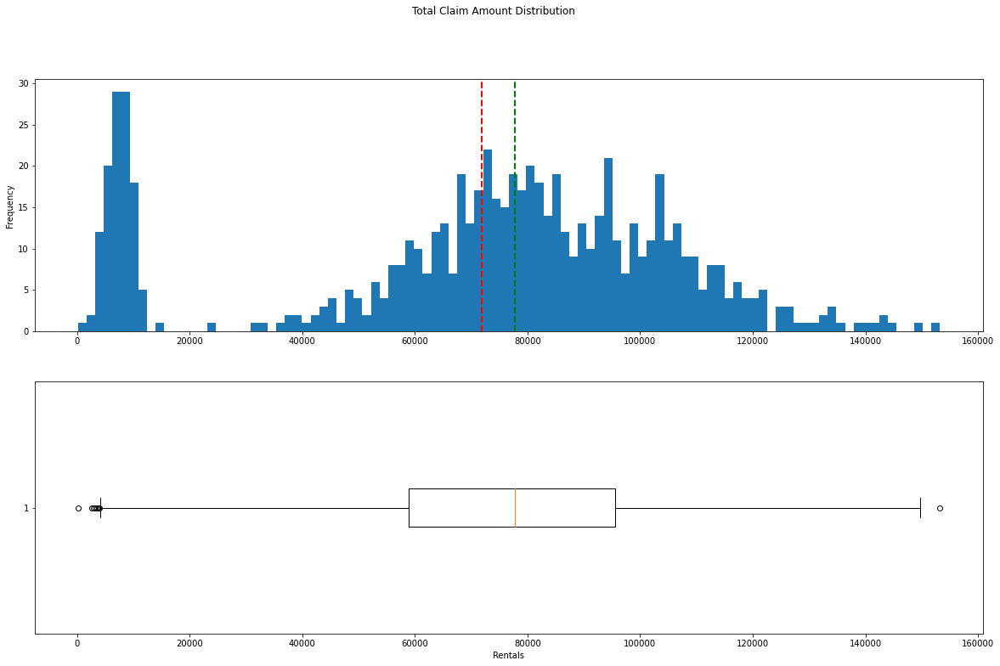

In [10]:
# Let's see the distribution of the total claim amount with the aid of some visualization
import matplotlib.pyplot as plt

label = train.total_claim_amount

# Create a figure for 2 subplots (2 rows, 1 column)
fig, ax = plt.subplots(2, 1, figsize = (20,12))

# Plot the histogram   
ax[0].hist(label, bins=100)
ax[0].set_ylabel('Frequency')

# Add lines for the mean, median
ax[0].axvline(label.mean(), color='red', linestyle='dashed', linewidth=2)
ax[0].axvline(label.median(), color='green', linestyle='dashed', linewidth=2)

# Plot the boxplot   
ax[1].boxplot(label, vert=False)
ax[1].set_xlabel('Rentals')

# Add a title to the Figure
fig.suptitle('Total Claim Amount Distribution')

# Show the figure
fig.show()

The plots show that the total claim amount ranges from 0 to just below 160,000. However, the mean and median numbers are almost at the middle of this range, with most of the data between 1000 and around 160,000 total claim amount. The few values above and below this range indicates the presence of outliers

In [11]:
#Let's explore the numerical variables
numeric_variables = ['months_as_customer', 'age', 'capital-gains', 'capital-loss', 'umbrella_limit', 'policy_annual_premium','insured_zip', 
                     'total_claim_amount']

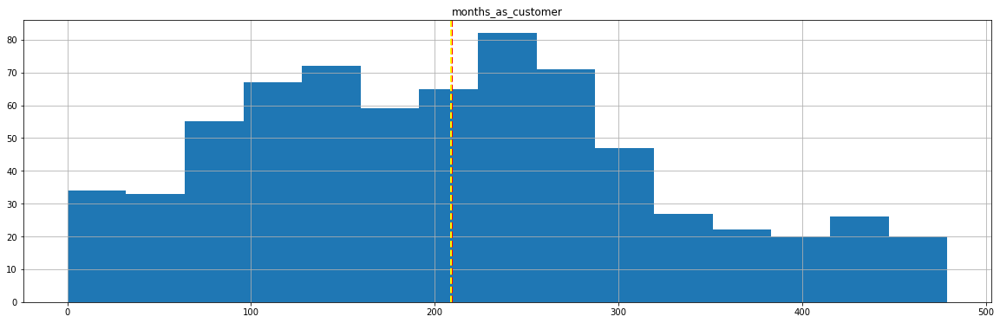

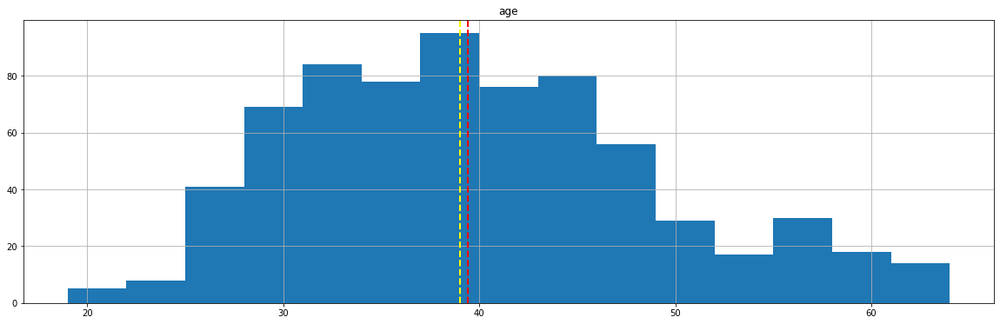

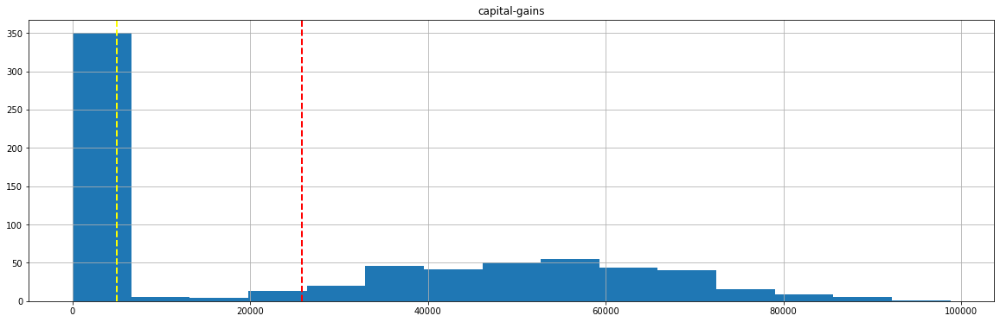

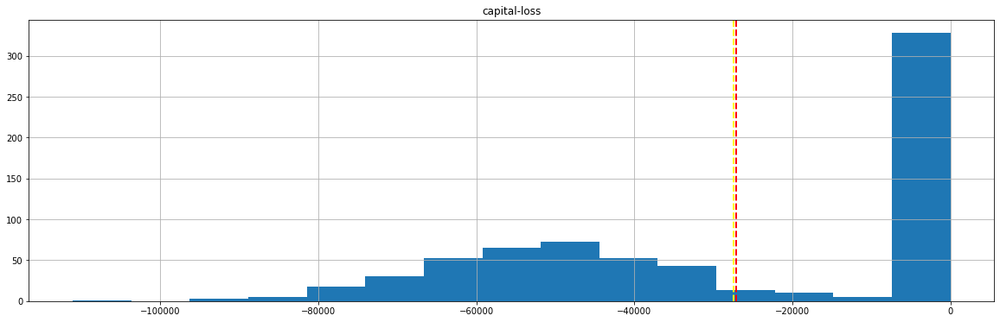

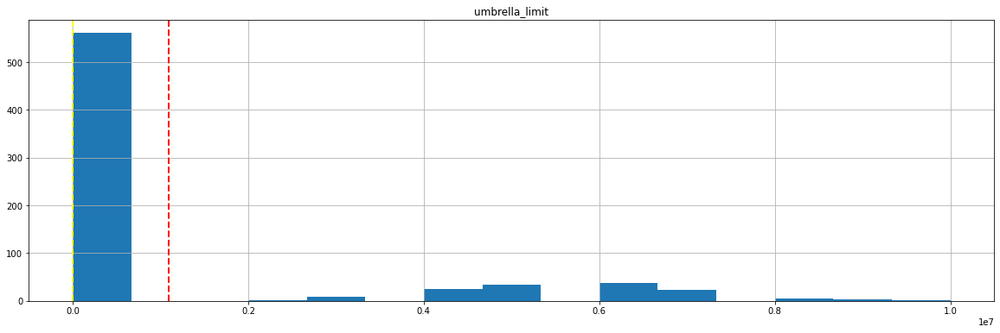

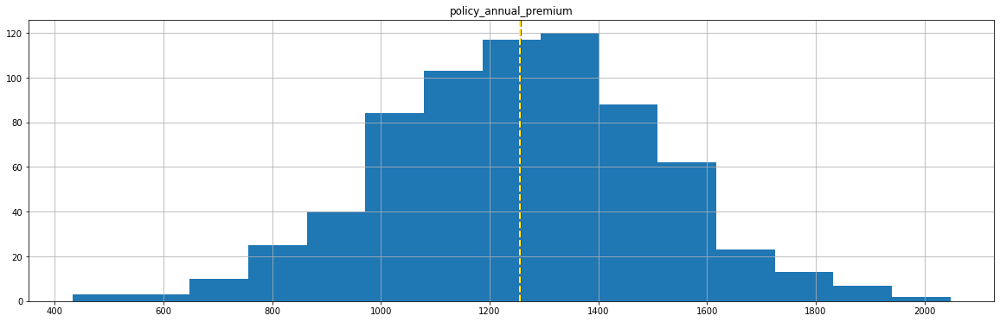

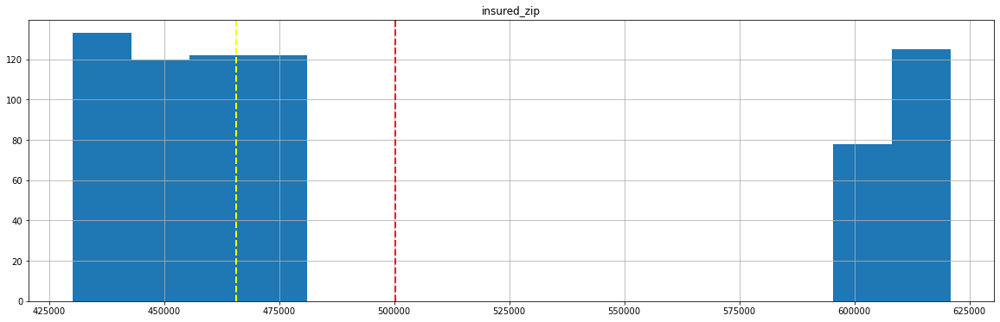

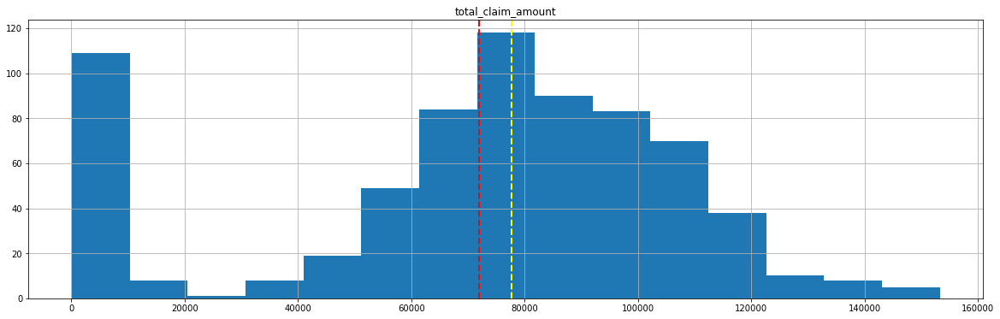

In [12]:
#Show the distribution of each numeric variable
for column in numeric_variables:
    fig = plt.figure(figsize=(20, 6))
    ax = fig.gca()
    variable = train[column]
    variable.hist(bins=15, ax = ax)
    ax.axvline(variable.mean(), color='red', linestyle='dashed', linewidth=2)
    ax.axvline(variable.median(), color='yellow', linestyle='dashed', linewidth=2)
    ax.set_title(column)
plt.show()

Several numerical features seem to be more *normally* distributed, with a few outliers

In [13]:
#Lets explore the categorical variable
categorical_variables = train.drop(['months_as_customer', 'age', 'capital-gains', 'capital-loss', 'umbrella_limit', 'policy_annual_premium',
                                    'insured_zip', 'total_claim_amount'], axis= 'columns')
categorical_variables

,Customer_ID,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,policy_state,policy_csl,policy_deductable,incident_hour_of_the_day,...,incident_severity,authorities_contacted,incident_state,incident_city,witnesses,police_report_available,auto_make,auto_model,auto_year,_c39
0,Customer_541,FEMALE,JD,farming-fishing,paintball,other-relative,OH,250/500,1000,22,...,Trivial Damage,Police,NC,Arlington,2,YES,Mercedes,E400,2013,NaN
1,Customer_440,MALE,Masters,protective-serv,yachting,not-in-family,IN,500/1000,2000,14,...,Total Loss,Fire,NY,Columbus,2,NO,Dodge,Neon,2006,NaN
2,Customer_482,MALE,JD,handlers-cleaners,golf,not-in-family,IN,500/1000,500,8,...,Major Damage,Other,WV,Riverwood,3,Not answered,Volkswagen,Passat,2004,NaN
3,Customer_422,MALE,High School,handlers-cleaners,hiking,husband,IN,500/1000,500,21,...,Major Damage,Other,WV,Columbus,0,Not answered,Toyota,Corolla,2012,NaN
4,Customer_778,MALE,PhD,priv-house-serv,exercise,not-in-family,IL,100/300,2000,0,...,Total Loss,Police,WV,Springfield,2,YES,Volkswagen,Jetta,2003,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
695,Customer_106,FEMALE,Associate,prof-specialty,basketball,husband,OH,500/1000,1000,6,...,Major Damage,Police,VA,Northbend,2,YES,Saab,95,2000,NaN
696,Customer_270,MALE,College,handlers-cleaners,camping,husband,OH,250/500,2000,6,...,Minor Damage,Police,VA,Arlington,0,YES,Toyota,Highlander,2003,NaN
697,Customer_860,FEMALE,MD,adm-clerical,golf,own-child,IN,100/300,1000,13,...,Minor Damage,Other,NY,Northbend,2,YES,Accura,MDX,1999,NaN
698,Customer_435,MALE,MD,machine-op-inspct,reading,wife,OH,250/500,500,6,...,Total Loss,Police,PA,Northbend,0,NO,Dodge,Neon,1996,NaN


<ipython-input-14-edf9125462c2>:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(20, 6))


TypeError: '<' not supported between instances of 'int' and 'str'

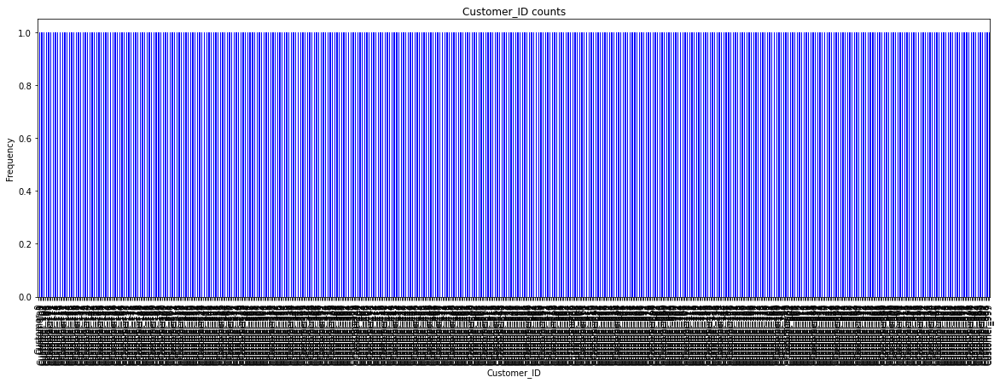

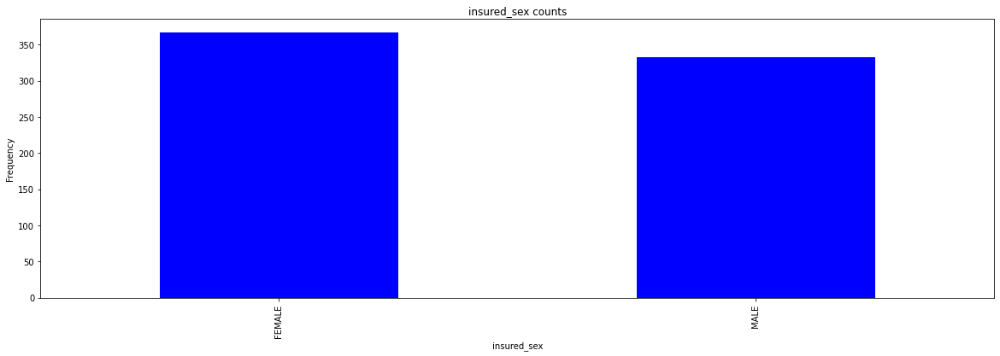

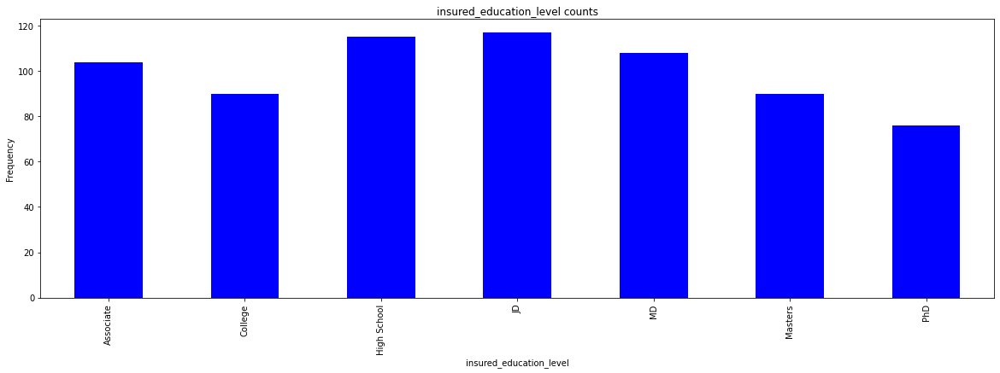

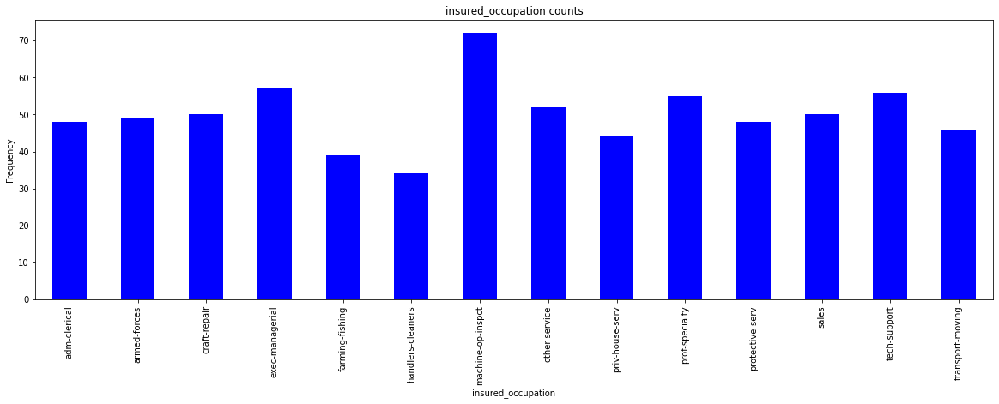

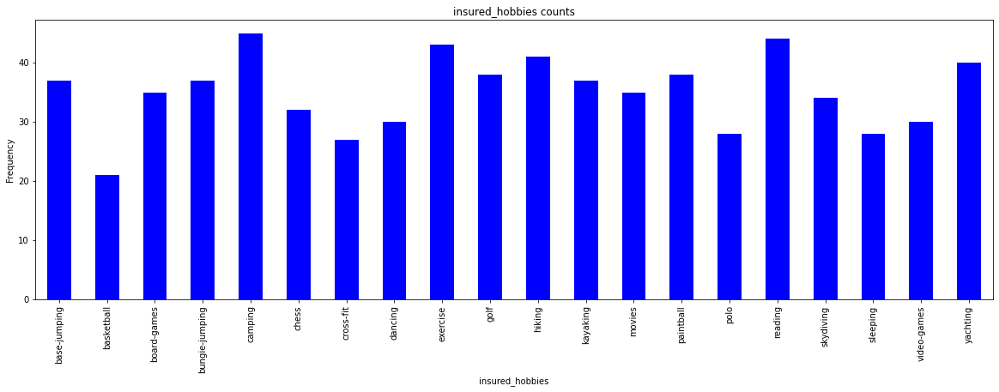

...

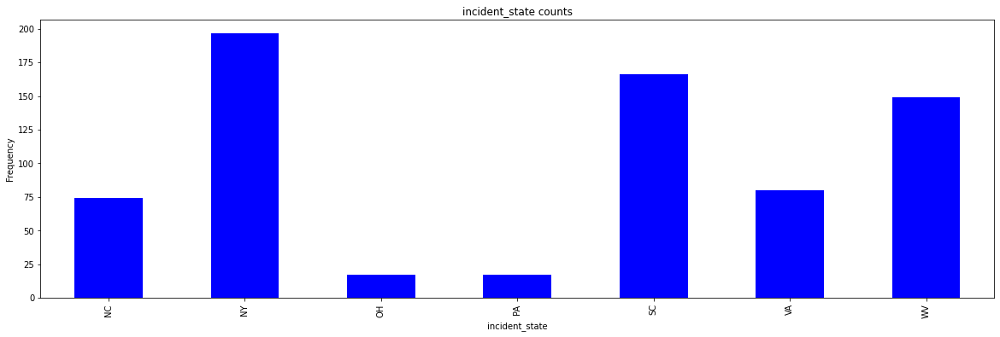

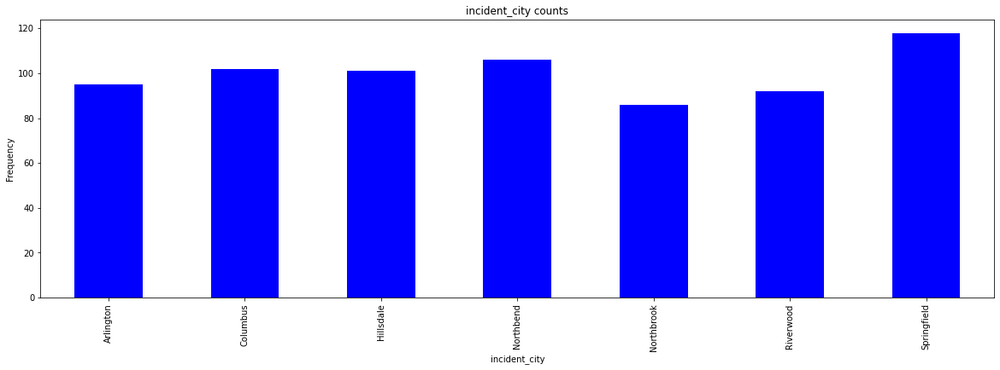

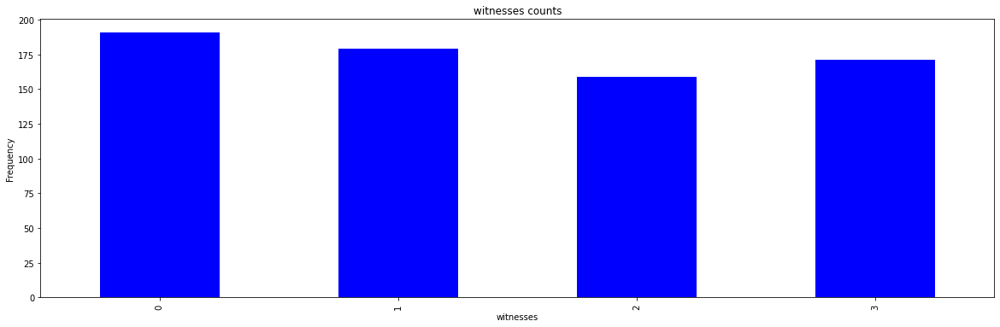

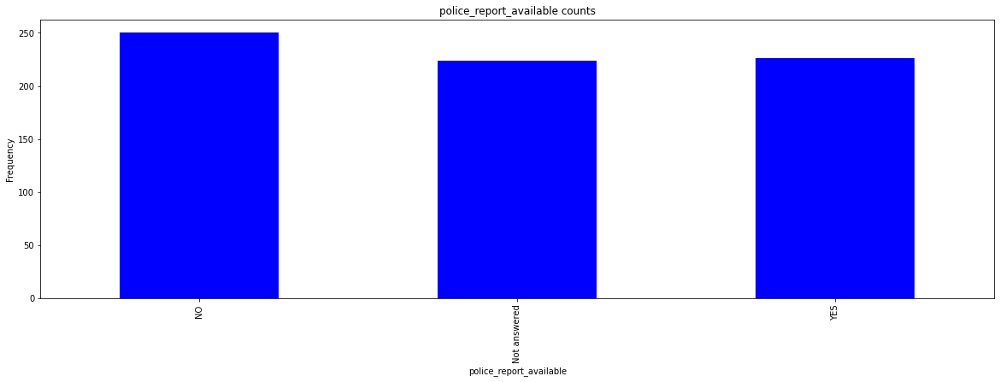

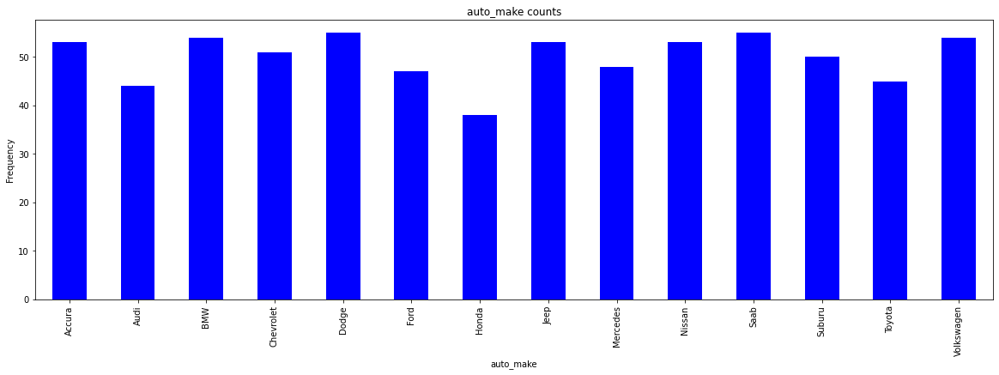

In [14]:
for columns in categorical_variables.columns:
    counts = train[columns].value_counts().sort_index()
    fig = plt.figure(figsize=(20, 6))
    ax = fig.gca()
    counts.plot.bar(ax = ax, color='blue')
    ax.set_title(columns + ' counts')
    ax.set_xlabel(columns) 
    ax.set_ylabel("Frequency")
plt.show()

Many of the categorical features show a more or less uniform distribution (meaning there's roughly the same number of rows for each category). 

We've seen the distribution of our data. Let's see the relationship between the features and the label (total claim amount) we want to be able to predict.

For the numeric features, scatter plots can best show the relationship between the feature and the label. Also, correlation statistic can be used to quantify the relationship

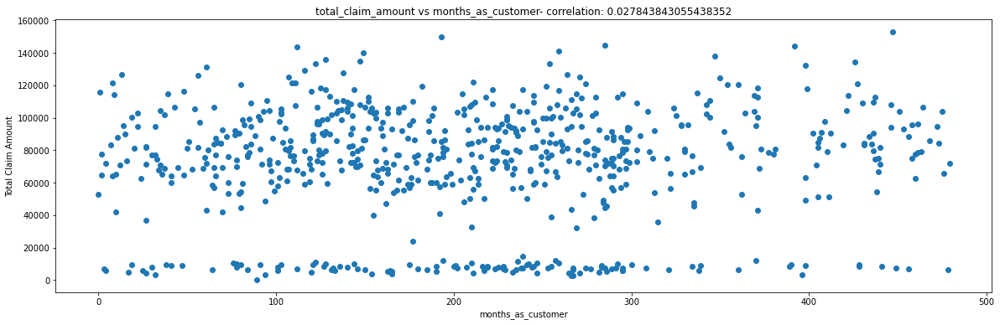

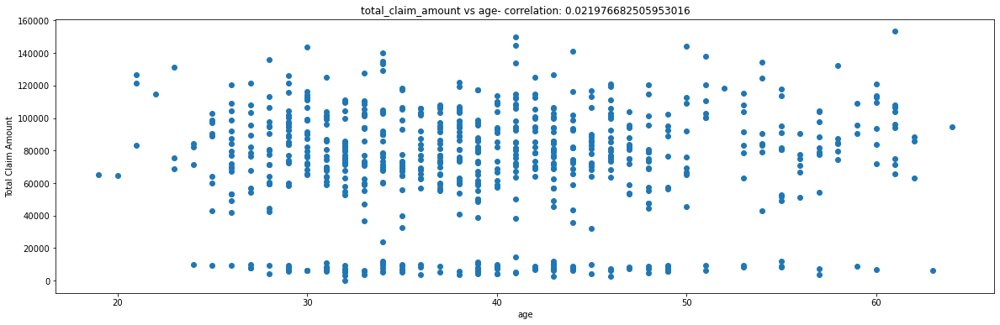

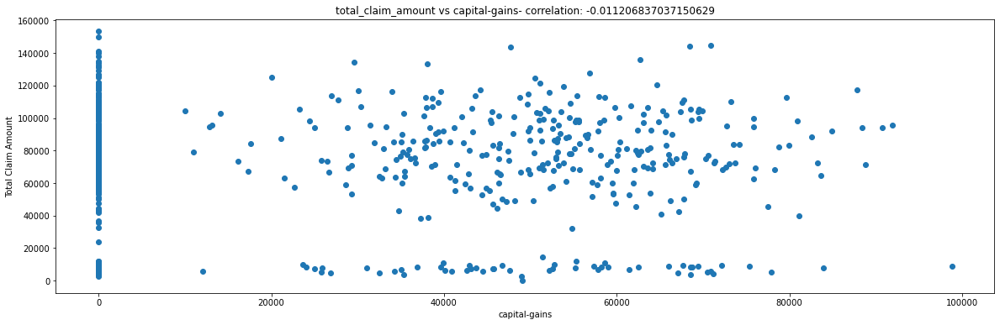

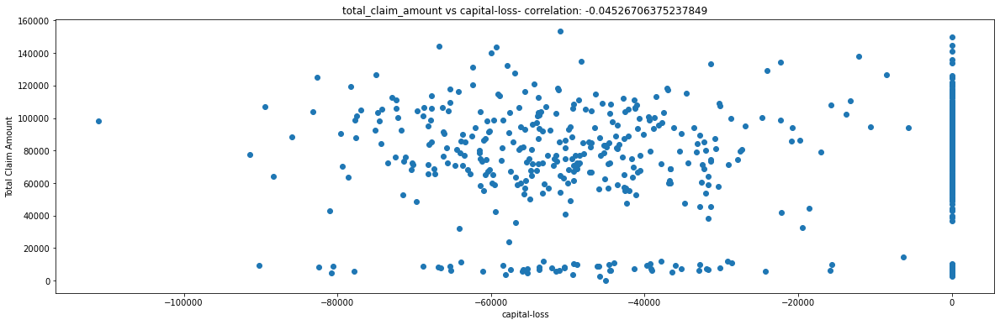

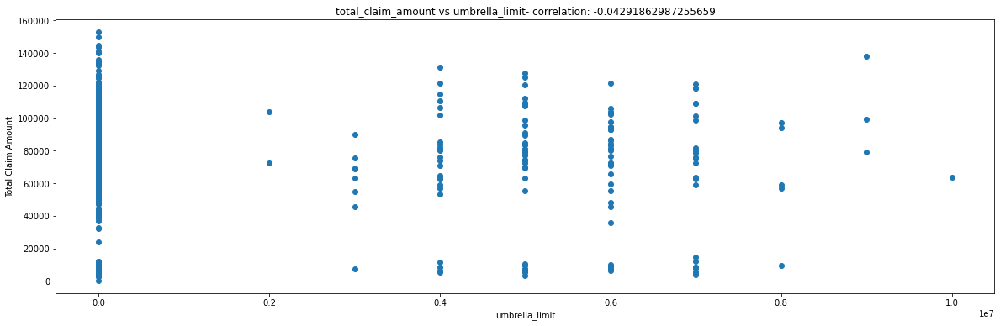

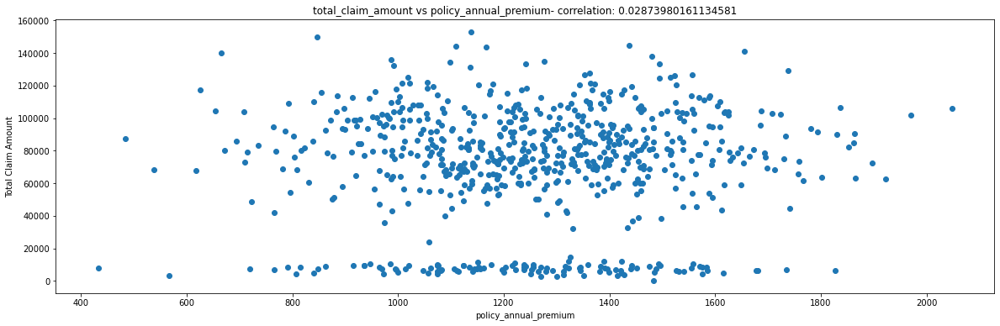

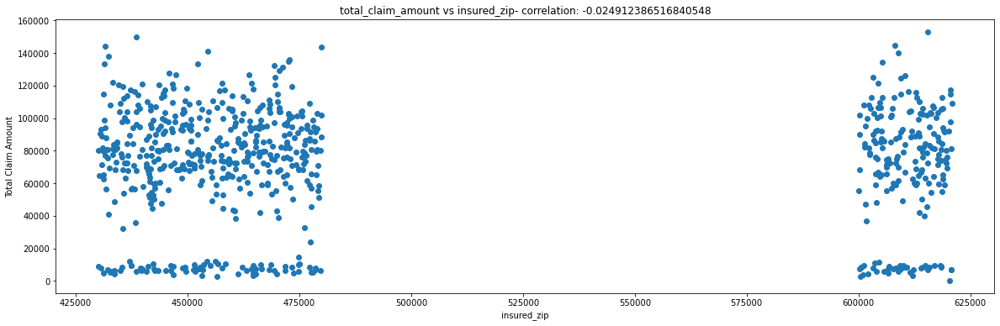

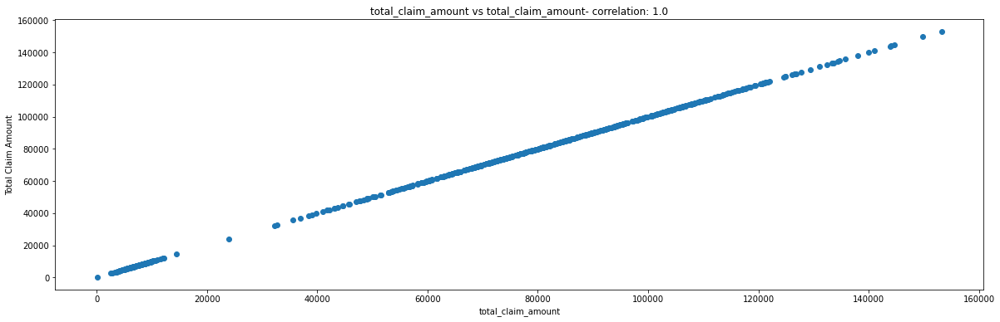

In [15]:
for columns in numeric_variables:
    fig = plt.figure(figsize=(20, 6))
    ax = fig.gca()
    feature = train[columns]
    label = train['total_claim_amount']
    correlation = feature.corr(label)
    plt.scatter(x=feature, y=label)
    plt.xlabel(columns)
    plt.ylabel('Total Claim Amount')
    ax.set_title('total_claim_amount vs ' + columns + '- correlation: ' + str(correlation))
plt.show()

The results doesn't show a clear correlation

Let's compare the categorical features to the label. We'll use a boxplot to show the distribution of the total claim amount for each category

<ipython-input-16-045b1814d378>:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(20, 6))
<ipython-input-16-045b1814d378>:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(20, 6))
<ipython-input-16-045b1814d378>:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figu

ValueError: not enough values to unpack (expected 2, got 0)

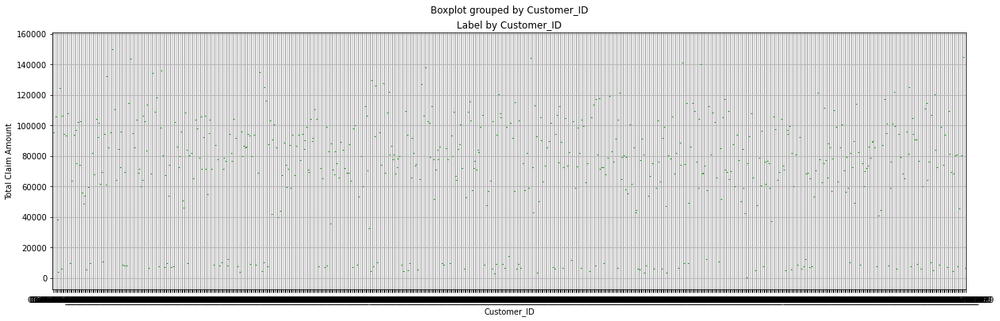

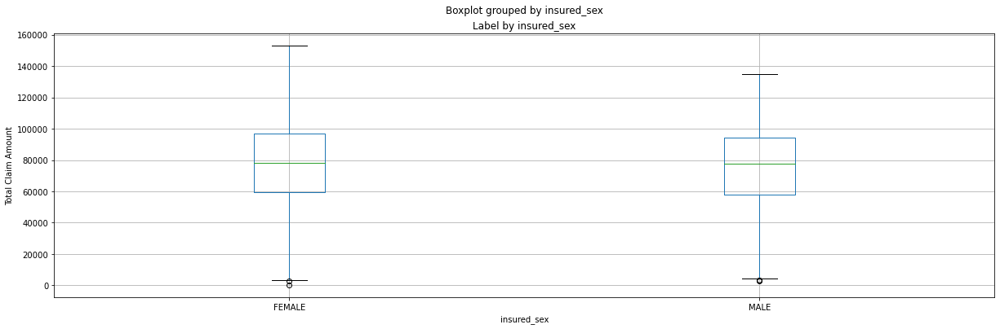

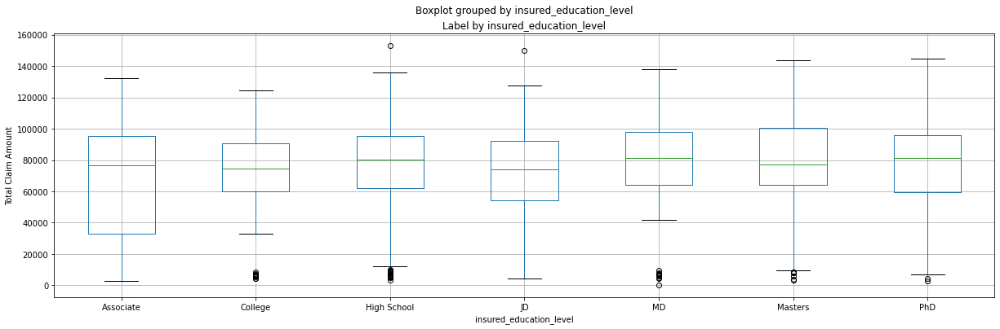

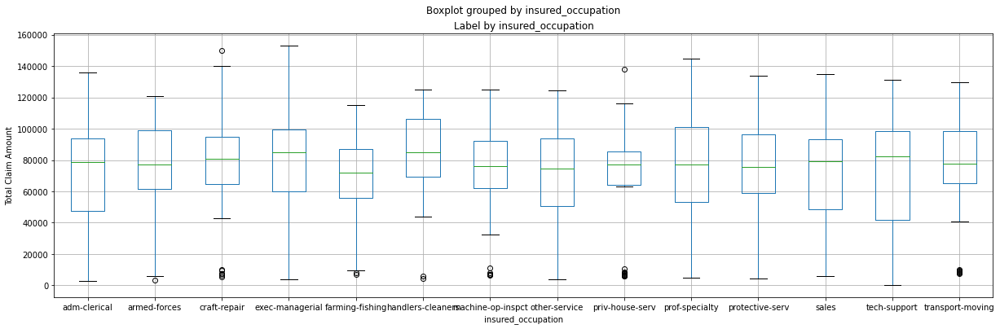

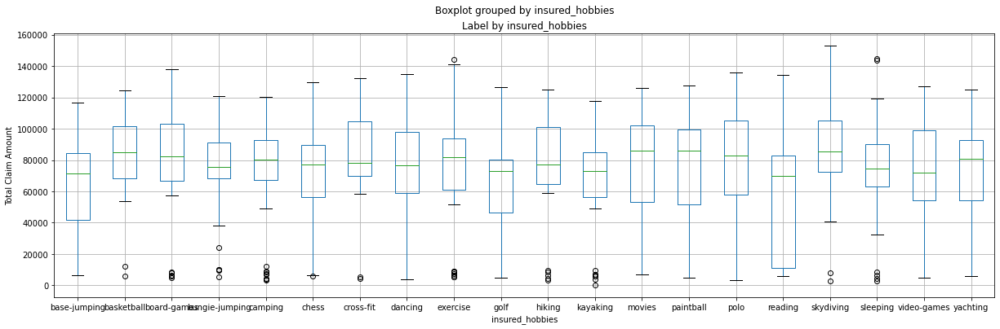

...

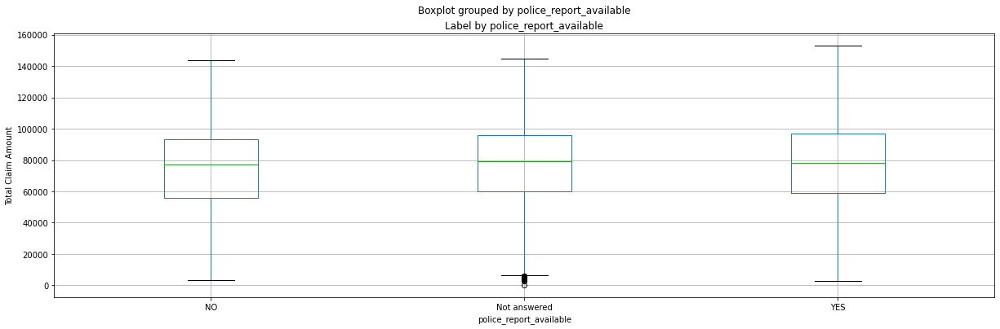

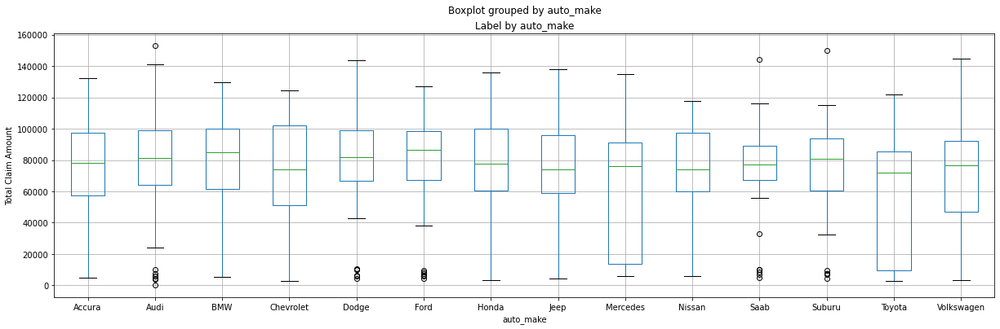

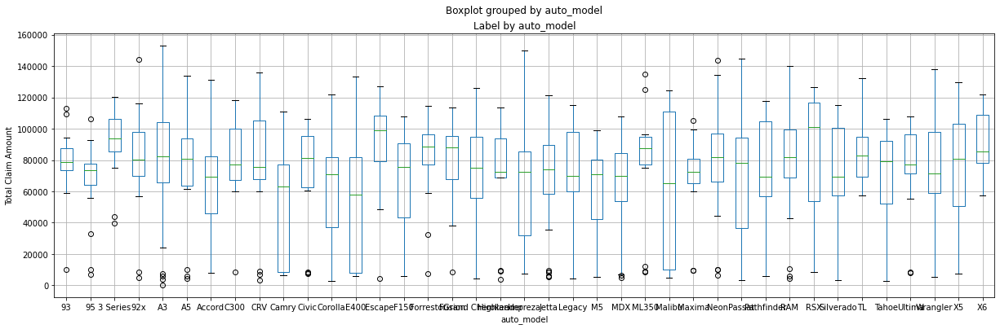

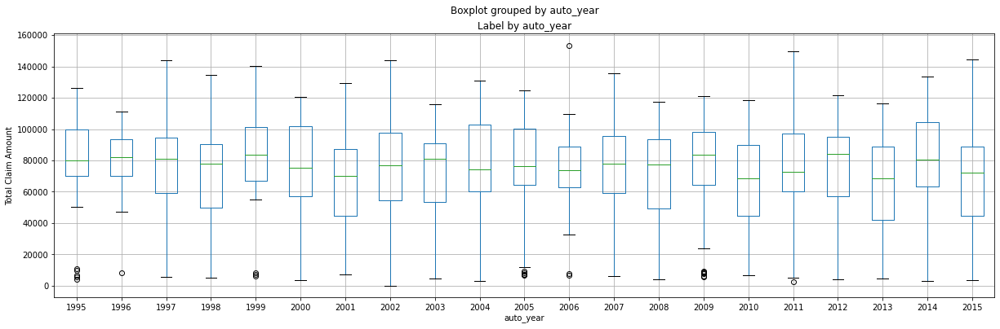

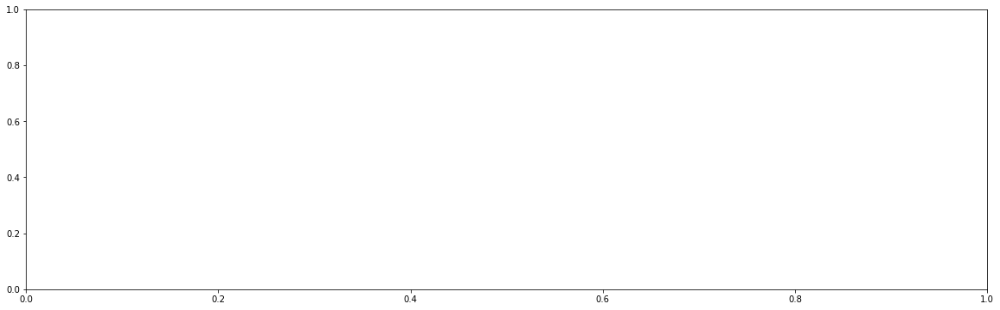

In [16]:
for columns in categorical_variables.columns:
    fig = plt.figure(figsize=(20, 6))
    ax = fig.gca()
    train.boxplot(column = 'total_claim_amount', by = columns, ax = ax)
    ax.set_title('Label by ' + columns)
    ax.set_ylabel("Total Claim Amount")
plt.show()

The plots show some variance in the relationship between some of the categorical variablees and total claim amounts. For example, there's a clear difference in the distribution of total claim amounts when the incident type is multi and single vehicle collision compared to parked car and vehicle theft. Similarly, there are notable differences for incident severity and auto-model categories. 

# Linear Regression Model

In [17]:
train.columns

Index(['Customer_ID', 'months_as_customer', 'age', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss', 'policy_state',
       'policy_csl', 'policy_deductable', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip',
       'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city', 'witnesses',
       'police_report_available', 'auto_make', 'auto_model', 'auto_year',
       '_c39', 'total_claim_amount'],
      dtype='object')

In [18]:
#The customer ID and the _c39 columns are unnecessary for our model
train = train.drop(['Customer_ID','_c39'], axis = 1)
test = test.drop(['Customer_ID','_c39'], axis = 1)

In [19]:
#Encode the categorical variables for the train dataset
train['insured_sex'] = train['insured_sex'].replace(('MALE','FEMALE'),(0,1))
print(train['insured_sex'].value_counts())
print('\n')

train['insured_education_level'] = train['insured_education_level'].replace(('Associate', 'College', 'High School','JD','Masters','MD','PhD'),(1,2,3,4,5,6,7))
print(train['insured_education_level'].value_counts())
print('\n')

train['insured_occupation'] = train['insured_occupation'].replace(('adm-clerical','armed-forces','craft-repair','exec-managerial','farming-fishing','handlers-cleaners','machine-op-inspct','other-service','priv-house-serv',
                                                                   'prof-specialty','protective-serv','sales','tech-support','transport-moving'),(1,2,3,4,5,6,7,8,9,10,11,12,13,14))
print(train['insured_occupation'].value_counts())
print('\n')

train['insured_hobbies'] = train['insured_hobbies'].replace(('base-jumping','basketball','board-games','bungie-jumping','camping','chess','cross-fit','dancing','exercise','golf','hiking','kayaking','movies','paintball',
                                                             'polo','reading','skydiving','sleeping','video-games','yachting'),(1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20))
print(train['insured_hobbies'].value_counts())
print('\n')

train['insured_relationship'] = train['insured_relationship'].replace(('husband','not-in-family','other-relative','own-child','unmarried','wife'),(1,2,3,4,5,6))
print(train['insured_relationship'].value_counts())
print('\n')

train['policy_state'] = train['policy_state'].replace(('IL','IN','OH'),(0,1,2))
print(train['policy_state'].value_counts())
print('\n')

train['policy_csl'] = train['policy_csl'].replace(('100/300','250/500','500/1000'),(0,1,2))
print(train['policy_csl'].value_counts())
print('\n')

train['property_damage'] = train['property_damage'].replace(('YES','NO', 'Not answered'),(0,1,2))
print(train['property_damage'].value_counts())
print('\n')

train['incident_type'] = train['incident_type'].replace(('Multi-vehicle Collision','Parked Car','Single Vehicle Collision','Vehicle Theft'),(0,1,2,3))
print(train['incident_type'].value_counts())
print('\n')

train['collision_type'] = train['collision_type'].replace(('Not answered','Front Collision','Rear Collision','Side Collision'),(0,1,2,3))
print(train['collision_type'].value_counts())
print('\n')

train['incident_severity'] = train['incident_severity'].replace(('Major Damage','Minor Damage','Total Loss','Trivial Damage'),(0,1,2,3))
print(train['incident_severity'].value_counts())
print('\n')

train['authorities_contacted'] = train['authorities_contacted'].replace(('Ambulance','Fire','None','Other','Police'),(0,1,2,3,4))
print(train['authorities_contacted'].value_counts())
print('\n')

train['incident_state'] = train['incident_state'].replace(('NC','NY','OH','PA','SC','VA','WV'),(0,1,2,3,4,5,6))
print(train['incident_state'].value_counts())
print('\n')

train['incident_city'] = train['incident_city'].replace(('Arlington','Columbus','Hillsdale','Northbend','Northbrook','Riverwood','Springfield'),(0,1,2,3,4,5,6))
print(train['incident_city'].value_counts())
print('\n')

train['police_report_available'] = train['police_report_available'].replace(('YES','NO', 'Not answered'),(0,1,2))
print(train['police_report_available'].value_counts())
print('\n')

train['auto_make'] = train['auto_make'].replace(('Accura','Audi', 'BMW', 'Chevrolet', 'Dodge', 'Ford', 'Honda', 'Jeep', 'Mercedes', 'Nissan', 'Saab', 'Suburu', 'Toyota', 'Volkswagen'),(1,2,3,4,5,6,7,8,9,10,11,12,13,14))
print(train['auto_make'].value_counts())
print('\n')

train['auto_model'] = train['auto_model'].replace(('93','95','3 Series','92x','A3','A5','Accord','C300','Camry','Civic','Corolla','CRV','E400','Escape','F150','Forrestor','Fusion','Grand Cherokee',
                                                   'Highlander','Impreza','Jetta','Legacy','M5','Malibu','Maxima','MDX','ML350','Neon','Passat','Pathfinder','RAM','RSX','Silverado','Tahoe','TL','Ultima',
                                                   'Wrangler','X5','X6'),(0.05,0.1,0.15,0.2,0.25,0.3,0.35,0.4,0.45,0.5,0.55,0.6,0.65,0.7,0.75,0.8,0.85,0.9,0.95,1,1.05,1.1,1.15,1.2,1.25,1.3,1.35,1.4,1.45,1.5,1.55,1.6,1.65,1.7,1.75,1.8,1.85,1.9,1.95))
print(train['auto_model'].value_counts())
print('\n')
train['auto_year'] = train['auto_year'].replace((1995, 1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015),
                                                (0.05,0.1,0.15,0.2,0.25,0.3,0.35,0.4,0.45,0.5,0.55,0.6,0.65,0.7,0.75,0.8,0.85,0.9,0.95,1,1.05))
print(train['auto_year'].value_counts())
print('\n')

1    367
0    333
Name: insured_sex, dtype: int64


4    117
3    115
6    108
1    104
5     90
2     90
7     76
Name: insured_education_level, dtype: int64


7     72
4     57
13    56
10    55
8     52
12    50
3     50
2     49
11    48
1     48
14    46
9     44
5     39
6     34
Name: insured_occupation, dtype: int64


5     45
16    44
9     43
11    41
20    40
14    38
10    38
12    37
4     37
1     37
13    35
3     35
17    34
6     32
19    30
8     30
15    28
18    28
7     27
2     21
Name: insured_hobbies, dtype: int64


4    127
3    121
2    119
6    116
1    116
5    101
Name: insured_relationship, dtype: int64


0    241
2    240
1    219
Name: policy_state, dtype: int64


1    241
0    237
2    222
Name: policy_csl, dtype: int64


2    255
1    224
0    221
Name: property_damage, dtype: int64


2    295
0    288
3     60
1     57
Name: incident_type, dtype: int64


2    204
3    197
1    182
0    117
Name: collision_type, dtype: int64


1    248
2    209
0    18

In [20]:
print(train.head())

   months_as_customer  age  insured_sex  insured_education_level  \
0                 239   41            1                        4   
1                 108   31            0                        5   
2                 116   30            0                        4   
3                   8   21            0                        3   
4                 161   38            0                        7   

   insured_occupation  insured_hobbies  insured_relationship  capital-gains  \
0                   5               14                     3          51400   
1                  11               20                     2              0   
2                   6               10                     2              0   
3                   6               11                     1              0   
4                   9                9                     2          60200   

   capital-loss  policy_state  ...  incident_severity  authorities_contacted  \
0         -6300             2  ...  

In [21]:
#Splitting Train data into features and labels 
x = train.drop(['total_claim_amount'], axis='columns')

y = train.total_claim_amount

In [22]:
print(len(x.columns))

30


In [23]:
#Split the Train data into train and test
from sklearn import metrics
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 1234)

In [24]:
print('Number of rows for X_train:', len(X_train))
print('Number of rows for X_test:', len(X_test))
print('Number of rows for y_train:', len(y_train))
print('Number of rows for y_test:', len(y_test))

Number of rows for X_train: 560
Number of rows for X_test: 140
Number of rows for y_train: 560
Number of rows for y_test: 140


In [25]:
#Train the model
from sklearn.linear_model import LinearRegression
Linear_model = LinearRegression()
Linear_model.fit(X_train, y_train)

LinearRegression()

In [26]:
#Make Predictions
linear_prediction = Linear_model.predict(X_test)
print(linear_prediction)

[ 83129.6934967  108264.70706325  47057.75534923  69686.46993657
  20863.32160888  36197.38641282  89512.05910092  70824.09330995
  40811.90952556  52826.31861392  62091.68080105  75360.51283194
  40702.63861653  61773.23328547  63873.48879205  63484.31797294
  95892.62807733  94092.56035965  28860.34603636  56284.18210338
  78926.59639039  77394.82013802  91207.07221214  88911.73367409
  71607.29353451  75971.41463863  58808.70342931  65119.44189273
  63655.73727031 103085.31220928  72060.24561906  98612.94679766
  67588.08751551  96333.53263645  72099.54794668  54185.68446479
  89155.46305979  94210.83808064  69054.64809874  37699.57352391
  40108.93425571  83994.41279999  43868.96693473  80718.97012164
  75752.33575341  94560.69855628  86703.76600155  90665.23146895
  83671.36267778  64544.2964331   47038.6316868   75409.43167038
  29159.74897989  26481.3222988   76784.26553193  72257.65854005
  90578.57378658  33731.47480567  77306.67385387  94746.80790544
  72343.30956793 108564.6

In [27]:
print(len(linear_prediction))

140


# Model Evaluation

In [28]:
import numpy as np
from sklearn.metrics import mean_squared_error, r2_score

mse = mean_squared_error(y_test,linear_prediction)
print("MSE:", mse)

rmse = np.sqrt(mse)
print("RMSE:", rmse)

r2 = r2_score(y_test, linear_prediction)
print("R2:", r2)

MSE: 784821104.0132407
RMSE: 28014.658734548968
R2: 0.37013922264569554


# Lasso Model

In [29]:
from sklearn.linear_model import Lasso
Lasso_model = Lasso()
Lasso_model.fit(X_train, y_train)

Lasso()

MSE: 784780885.2170519
RMSE: 28013.940908359393
R2: 0.37017150037383284


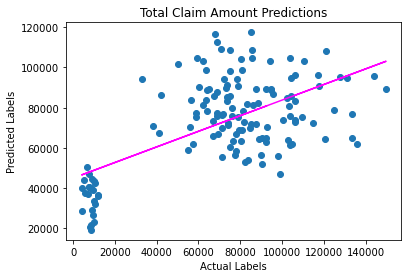

In [30]:
# Evaluate the model using the test data
Lasso_predictions = Lasso_model.predict(X_test)
mse = mean_squared_error(y_test, Lasso_predictions)
print("MSE:", mse)
rmse = np.sqrt(mse)
print("RMSE:", rmse)
r2 = r2_score(y_test, Lasso_predictions)
print("R2:", r2)

# Plot predicted vs actual
plt.scatter(y_test, Lasso_predictions)
plt.xlabel('Actual Labels')
plt.ylabel('Predicted Labels')
plt.title('Total Claim Amount Predictions')
# overlay the regression line
z = np.polyfit(y_test, Lasso_predictions, 1)
p = np.poly1d(z)
plt.plot(y_test,p(y_test), color='magenta')
plt.show()

# Decision Tree Model

In [31]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import export_text

# Train the model
Decision_Tree_Model = DecisionTreeRegressor()
Decision_Tree_Model.fit(X_train, y_train)
print (Decision_Tree_Model, "\n")

# Visualize the model tree
tree = export_text(Decision_Tree_Model)
print(tree)

DecisionTreeRegressor() 

|--- feature_20 <= 0.50
|   |--- feature_24 <= 1.50
|   |   |--- feature_12 <= 21.00
|   |   |   |--- feature_23 <= 3.50
|   |   |   |   |--- feature_8 <= -32200.00
|   |   |   |   |   |--- feature_19 <= 2.00
|   |   |   |   |   |   |--- feature_3 <= 2.50
|   |   |   |   |   |   |   |--- value: [6746.67]
|   |   |   |   |   |   |--- feature_3 >  2.50
|   |   |   |   |   |   |   |--- value: [7560.00]
|   |   |   |   |   |--- feature_19 >  2.00
|   |   |   |   |   |   |--- feature_16 <= 1393.58
|   |   |   |   |   |   |   |--- value: [8266.67]
|   |   |   |   |   |   |--- feature_16 >  1393.58
|   |   |   |   |   |   |   |--- value: [8666.67]
|   |   |   |   |--- feature_8 >  -32200.00
|   |   |   |   |   |--- feature_16 <= 1288.89
|   |   |   |   |   |   |--- feature_11 <= 1250.00
|   |   |   |   |   |   |   |--- value: [9480.00]
|   |   |   |   |   |   |--- feature_11 >  1250.00
|   |   |   |   |   |   |   |--- feature_28 <= 1.27
|   |   |   |   |   |   |   | 

MSE: 855392692.421598
RMSE: 29247.097162309936
R2: 0.31350176054545875


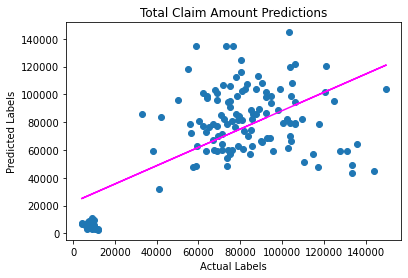

In [32]:
# Evaluate the model using the test data
Decision_tree_predictions = Decision_Tree_Model.predict(X_test)
mse = mean_squared_error(y_test, Decision_tree_predictions)
print("MSE:", mse)
rmse = np.sqrt(mse)
print("RMSE:", rmse)
r2 = r2_score(y_test, Decision_tree_predictions)
print("R2:", r2)

# Plot predicted vs actual
plt.scatter(y_test, Decision_tree_predictions)
plt.xlabel('Actual Labels')
plt.ylabel('Predicted Labels')
plt.title('Total Claim Amount Predictions')
# overlay the regression line
z = np.polyfit(y_test, Decision_tree_predictions, 1)
p = np.poly1d(z)
plt.plot(y_test,p(y_test), color='magenta')
plt.show()

# Random Forest Regressor Model

RandomForestRegressor() 

MSE: 425382430.57370716
RMSE: 20624.8013462847
R2: 0.6586079209339173


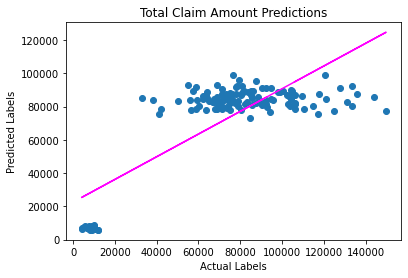

In [33]:
from sklearn.ensemble import RandomForestRegressor

# Train the model
Regressor_model = RandomForestRegressor()
Regressor_model.fit(X_train, y_train)
print (Regressor_model, "\n")

# Evaluate the model using the test data
Regressor_predictions = Regressor_model.predict(X_test)
mse = mean_squared_error(y_test, Regressor_predictions)
print("MSE:", mse)
rmse = np.sqrt(mse)
print("RMSE:", rmse)
r2 = r2_score(y_test, Regressor_predictions)
print("R2:", r2)

# Plot predicted vs actual
plt.scatter(y_test, Regressor_predictions)
plt.xlabel('Actual Labels')
plt.ylabel('Predicted Labels')
plt.title('Total Claim Amount Predictions')
# overlay the regression line
z = np.polyfit(y_test, Regressor_predictions, 1)
p = np.poly1d(z)
plt.plot(y_test,p(y_test), color='magenta')
plt.show()

# Save the Model

In [34]:
import joblib

# Save the model as a pickle file
filename = 'C:/Work Files/Personal Data Analytics/Datasets/Data Science Nigeria Hackathon/Model.pkl'
joblib.dump(Regressor_model, filename)

['C:/Work Files/Personal Data Analytics/Datasets/Data Science Nigeria Hackathon/Model.pkl']

# Use the Saved Model to Predict Total Claim Amount for the Test Dataset

In [35]:
# Load the model from the file
loaded_model = joblib.load(filename)

In [36]:
#Encode the categorical variables for the train dataset
test['insured_sex'] = test['insured_sex'].replace(('MALE','FEMALE'),(0,1))
print(test['insured_sex'].value_counts())
print('\n')

test['insured_education_level'] = test['insured_education_level'].replace(('Associate', 'College', 'High School','JD','Masters','MD','PhD'),(1,2,3,4,5,6,7))
print(test['insured_education_level'].value_counts())
print('\n')

test['insured_occupation'] = test['insured_occupation'].replace(('adm-clerical','armed-forces','craft-repair','exec-managerial','farming-fishing','handlers-cleaners','machine-op-inspct','other-service','priv-house-serv',
                                                                   'prof-specialty','protective-serv','sales','tech-support','transport-moving'),(1,2,3,4,5,6,7,8,9,10,11,12,13,14))
print(test['insured_occupation'].value_counts())
print('\n')

test['insured_hobbies'] = test['insured_hobbies'].replace(('base-jumping','basketball','board-games','bungie-jumping','camping','chess','cross-fit','dancing','exercise','golf','hiking','kayaking','movies','paintball',
                                                             'polo','reading','skydiving','sleeping','video-games','yachting'),(1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20))
print(test['insured_hobbies'].value_counts())
print('\n')

test['insured_relationship'] = test['insured_relationship'].replace(('husband','not-in-family','other-relative','own-child','unmarried','wife'),(1,2,3,4,5,6))
print(test['insured_relationship'].value_counts())
print('\n')

test['policy_state'] = test['policy_state'].replace(('IL','IN','OH'),(0,1,2))
print(test['policy_state'].value_counts())
print('\n')

test['policy_csl'] = test['policy_csl'].replace(('100/300','250/500','500/1000'),(0,1,2))
print(test['policy_csl'].value_counts())
print('\n')

test['property_damage'] = test['property_damage'].replace(('YES','NO', 'Not answered'),(0,1,2))
print(test['property_damage'].value_counts())
print('\n')

test['incident_type'] = test['incident_type'].replace(('Multi-vehicle Collision','Parked Car','Single Vehicle Collision','Vehicle Theft'),(0,1,2,3))
print(test['incident_type'].value_counts())
print('\n')

test['collision_type'] = test['collision_type'].replace(('Not answered','Front Collision','Rear Collision','Side Collision'),(0,1,2,3))
print(test['collision_type'].value_counts())
print('\n')

test['incident_severity'] = test['incident_severity'].replace(('Major Damage','Minor Damage','Total Loss','Trivial Damage'),(0,1,2,3))
print(test['incident_severity'].value_counts())
print('\n')

test['authorities_contacted'] = test['authorities_contacted'].replace(('Ambulance','Fire','None','Other','Police'),(0,1,2,3,4))
print(test['authorities_contacted'].value_counts())
print('\n')

test['incident_state'] = test['incident_state'].replace(('NC','NY','OH','PA','SC','VA','WV'),(0,1,2,3,4,5,6))
print(test['incident_state'].value_counts())
print('\n')

test['incident_city'] = test['incident_city'].replace(('Arlington','Columbus','Hillsdale','Northbend','Northbrook','Riverwood','Springfield'),(0,1,2,3,4,5,6))
print(test['incident_city'].value_counts())
print('\n')

test['police_report_available'] = test['police_report_available'].replace(('YES','NO', 'Not answered'),(0,1,2))
print(test['police_report_available'].value_counts())
print('\n')

test['auto_make'] = test['auto_make'].replace(('Accura','Audi', 'BMW', 'Chevrolet', 'Dodge', 'Ford', 'Honda', 'Jeep', 'Mercedes', 'Nissan', 'Saab', 'Suburu', 'Toyota', 'Volkswagen'),(1,2,3,4,5,6,7,8,9,10,11,12,13,14))
print(test['auto_make'].value_counts())
print('\n')

test['auto_model'] = test['auto_model'].replace(('93','95','3 Series','92x','A3','A5','Accord','C300','Camry','Civic','Corolla','CRV','E400','Escape','F150','Forrestor','Fusion','Grand Cherokee',
                                                   'Highlander','Impreza','Jetta','Legacy','M5','Malibu','Maxima','MDX','ML350','Neon','Passat','Pathfinder','RAM','RSX','Silverado','Tahoe','TL','Ultima',
                                                   'Wrangler','X5','X6'),(0.05,0.1,0.15,0.2,0.25,0.3,0.35,0.4,0.45,0.5,0.55,0.6,0.65,0.7,0.75,0.8,0.85,0.9,0.95,1,1.05,1.1,1.15,1.2,1.25,1.3,1.35,1.4,1.45,1.5,1.55,1.6,1.65,1.7,1.75,1.8,1.85,1.9,1.95))
print(test['auto_model'].value_counts())
print('\n')
test['auto_year'] = test['auto_year'].replace((1995, 1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015),
                                                (0.05,0.1,0.15,0.2,0.25,0.3,0.35,0.4,0.45,0.5,0.55,0.6,0.65,0.7,0.75,0.8,0.85,0.9,0.95,1,1.05))
print(test['auto_year'].value_counts())
print('\n')

1    170
0    130
Name: insured_sex, dtype: int64


5    53
7    49
3    45
4    44
1    41
6    36
2    32
Name: insured_education_level, dtype: int64


10    30
9     27
14    26
12    26
3     24
13    22
7     21
6     20
2     20
8     19
4     19
1     17
11    15
5     14
Name: insured_occupation, dtype: int64


16    20
13    20
19    20
15    19
14    19
4     19
10    17
12    17
17    15
6     14
9     14
2     13
3     13
20    13
8     13
18    13
1     12
11    11
5     10
7      8
Name: insured_hobbies, dtype: int64


4    56
3    56
2    55
1    54
5    40
6    39
Name: insured_relationship, dtype: int64


2    112
0     97
1     91
Name: policy_state, dtype: int64


0    112
1    110
2     78
Name: policy_csl, dtype: int64


1    114
2    105
0     81
Name: property_damage, dtype: int64


0    131
2    108
3     34
1     27
Name: incident_type, dtype: int64


2    88
3    79
1    72
0    61
Name: collision_type, dtype: int64


1    106
0     87
2     71
3     36
Name: 

In [37]:
# Use the loaded model to predict the total claim amount
prediction = loaded_model.predict(test)

In [38]:
#Convert to Dataframe
test_prediction = pd.DataFrame(prediction)

In [39]:
#Export to Excel
test_prediction.to_csv('C:/Work Files/Personal Data Analytics/Datasets/Data Science Nigeria Hackathon/Regressor Model Prediction 5.csv')

In [40]:
test_prediction

,0
0,78492.9331
1,81449.9998
2,85278.2668
3,85511.8669
4,7191.0668
...,...
295,78316.2662
296,81966.1332
297,73928.5332
298,77999.3329
